# Project 2：NASA Data Acquisation, Visualization, and Analysis
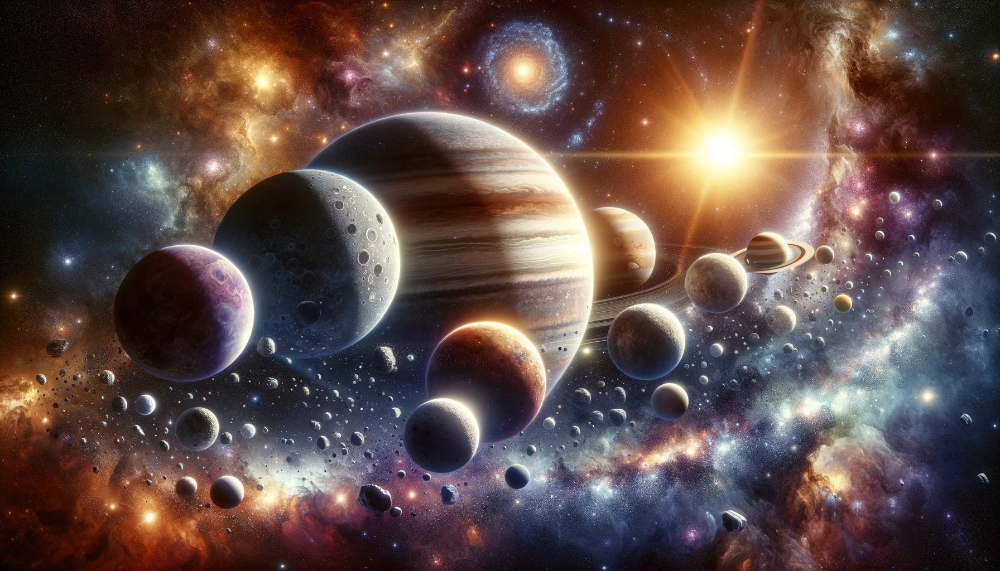

In [1]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the NASA API and Data Collection

- Register for a NASA API key and understand the different types of data that the API provides.
- Run the Python script below to fetch data about **Near Earth Objects (NEOs)** from the NASA API for a years data.
- Extract and understand the different pieces of data provided for each NEO.

In [4]:
import requests
import time
from datetime import datetime, timedelta
from getpass import getpass
import pandas as pd

# Set your NASA API KEY, this step asks you to enter your API KEY.
# (The input box may be float in the top on your editor.)
#uyhKZkLVS9wX99tkEupfAf6WfvVdjgIeUAD4LYbB
api_key = getpass()

In [5]:
# Set the start and end dates for the data you want to fetch
start_date = datetime.strptime('2022-01-01', '%Y-%m-%d')
end_date = start_date + timedelta(days=365)  # 1 year later

# Initialize a list to store the data
data = []

# Fetch data from the NASA API 7 days at a time
# The introduction of the API is on https://api.nasa.gov, under "Browse APIs" -> "Asteroids NeoWs"
# You can look into the example query in the link below to see what the data look like:
# https://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-07&end_date=2015-09-08&api_key=DEMO_KEY
current_date = start_date
while current_date < end_date:
    next_date = min(current_date + timedelta(days=7), end_date)
    response = requests.get(f'https://api.nasa.gov/neo/rest/v1/feed?start_date={current_date.strftime("%Y-%m-%d")}&end_date={next_date.strftime("%Y-%m-%d")}&api_key={api_key}')
    data.append(response.json())
    current_date = next_date
    time.sleep(1)  # To avoid hitting the rate limit

# Now 'data' contains the NEO data for the 1-year period


In [6]:
# Check the date coverage of your data.
dates_contained_in_data = []
for d in data:
    dates_contained_in_data += list(d['near_earth_objects'].keys())

print(sorted(dates_contained_in_data))

['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-08', '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-15', '2022-01-16', '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20', '2022-01-21', '2022-01-22', '2022-01-22', '2022-01-23', '2022-01-24', '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28', '2022-01-29', '2022-01-29', '2022-01-30', '2022-01-31', '2022-02-01', '2022-02-02', '2022-02-03', '2022-02-04', '2022-02-05', '2022-02-05', '2022-02-06', '2022-02-07', '2022-02-08', '2022-02-09', '2022-02-10', '2022-02-11', '2022-02-12', '2022-02-12', '2022-02-13', '2022-02-14', '2022-02-15', '2022-02-16', '2022-02-17', '2022-02-18', '2022-02-19', '2022-02-19', '2022-02-20', '2022-02-21', '2022-02-22', '2022-02-23', '2022-02-24', '2022-02-25', '2022-02-26', '2022-02-26', '2022-02-27', '2022-02-28', '2022-03-01', '2022-03-02', '2022-03-03', '2022-03-04', '2022

In [7]:
from src.utils import get_a_random_chunk_property

In [8]:
get_a_random_chunk_property(data)

date: 2022-11-10
NEO name: (2021 SA2)
absolute_magnitude_h: 26.21


For the remaining tasks, you have to organize the data as pd.DataFrame so as to suit the specific need in each task. This part may require a considerably amount of efforts, which is normal in data science and analytics works.

**Remark**. This part is coding intensive. There is no magic way to extract the data by one or two lines of code. Instead, you're expected to write your own code for this purpose.

### Task 2: Data Analysis

- Calculate the average size of the NEOs for each day.
- Determine the proportion of NEOs that are potentially hazardous.
- Find the NEO with the closest approach distance for each day.
- Use statistical methods to analyze the data. Calculate the mean, median, mode, and standard deviation of the NEO sizes. Besides, define at least two other statistic and compute them for anlayzing the data further. 
- Use statistical methods to determine if the size of a NEO is correlated with whether it is potentially hazardous.

Before we start working on the points. Let us start by converting data into a dataframe which we can use throughout the tasks. We want to visualize it well like this

We start by printing data, so that we can see what entitites we can get from the json structure from Nasa

In [9]:
data

[{'links': {'next': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-01-08&end_date=2022-01-15&detailed=false&api_key=uyhKZkLVS9wX99tkEupfAf6WfvVdjgIeUAD4LYbB',
   'previous': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2021-12-25&end_date=2022-01-01&detailed=false&api_key=uyhKZkLVS9wX99tkEupfAf6WfvVdjgIeUAD4LYbB',
   'self': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-01-01&end_date=2022-01-08&detailed=false&api_key=uyhKZkLVS9wX99tkEupfAf6WfvVdjgIeUAD4LYbB'},
  'element_count': 133,
  'near_earth_objects': {'2022-01-07': [{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2216523?api_key=uyhKZkLVS9wX99tkEupfAf6WfvVdjgIeUAD4LYbB'},
     'id': '2216523',
     'neo_reference_id': '2216523',
     'name': '216523 (2001 HY7)',
     'nasa_jpl_url': 'https://ssd.jpl.nasa.gov/tools/sbdb_lookup.html#/?sstr=2216523',
     'absolute_magnitude_h': 20.7,
     'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.1925550782,
       'estimated_diameter_max': 0.430

We can see what we are going to use, we just take everything but without the miles, because we work with kilometers

In [10]:
#Starting the list as empty so we dont get an error
neo_list = []

#Making the data into a list which we can use for now
for dataa in data:
    for date in dataa['near_earth_objects']:
        for neo in dataa['near_earth_objects'][date]:
            neo_details = {
                'id': neo['id'],
                'name': neo['name'],
                'date': date,
                'estimated_diameter_min_km': neo['estimated_diameter']['kilometers']['estimated_diameter_min'],
                'estimated_diameter_max_km': neo['estimated_diameter']['kilometers']['estimated_diameter_max'],
                'is_potentially_hazardous_asteroid': neo['is_potentially_hazardous_asteroid'],
                'close_approach_date': neo['close_approach_data'][0]['close_approach_date'],
                'miss_distance_km': float(neo['close_approach_data'][0]['miss_distance']['kilometers']), #We will use this one later
            }
            neo_list.append(neo_details)

#Converting the list to a DataFrame
neo_df = pd.DataFrame(neo_list)

#We had an issue before, so we want to keep it as date - we ensure it like this
neo_df['date'] = pd.to_datetime(neo_df['date'])

We will now take each point from above (task 2), and take one by one, and comment on each of our findings

#### Finding the avg. size of Neos per day

These findings can give us a little bit of insight of what is around us in space!

Now we can work with what we have, to find the average size

In [11]:
#We create a new column.neo_df.
#Finding avg. size for each and every one of the NEO's, because the dataset tells us that it is kind of unsure of the size
#so it gives us estimates of what they think is minimum and maximum. 
neo_df['average_diameter_km'] = (neo_df['estimated_diameter_min_km'] + neo_df['estimated_diameter_max_km']) / 2

#Grouping by date so it finds the day, and finding the mean of each one. Then we reset index so that our own column name is there
average_size_per_day = neo_df.groupby(neo_df['date'].dt.date)['average_diameter_km'].mean().reset_index()
average_size_per_day

,date,average_diameter_km
0,2022-01-01,0.164724
1,2022-01-02,0.110705
2,2022-01-03,0.027143
3,2022-01-04,0.086817
4,2022-01-05,0.167149
...,...,...
361,2022-12-28,0.118181
362,2022-12-29,0.189519
363,2022-12-30,0.130261
364,2022-12-31,0.049165


**Our comment**

The average size of Near Earth Objects (NEOs) varies daily throughout the year. From the data, we can see fluctuations in the average diameter of NEOs, which helps in understanding the size distribution of these objects over time.

#### Determining the potentially harzadous

We already have the dataframe, so it is easy to go. Whilst working on new tasks, we update our dataframe structure which we made before.

In [12]:
#Determining the proportion of NEOs that are potentially hazardous by averaging on their booleans
proportion_hazardous = neo_df['is_potentially_hazardous_asteroid'].mean()

#Here are the results
print(f"\nProportion of NEOs that are potentially hazardous: {proportion_hazardous:.2%}")


Proportion of NEOs that are potentially hazardous: 6.30%


The code above calculates the proportion of NEOs that are considered potentially hazardous by averaging the boolean values in the is_potentially_hazardous_asteroid column.
The proportion of NEOs that are potentially hazardous is 6.30%. This shows that there actually is a small percentage of the detected NEOs that pose a potential threat to Earth.

#### Closest NEO approach to earth by each day

In [32]:
#We use the column miss_distance_km to find the NEO with the closest approach distance for each day.
#First we group the DataFrame by date using 'date'.dt.date.
#Then we find the index of the minimum miss_distance_km for each group from.
#And then lastly we locate these rows in the original DataFrame and reset the index.
closest_NEO_per_day = neo_df.loc[neo_df.groupby(neo_df['date'].dt.date)['miss_distance_km'].idxmin()].reset_index(drop=True)

# Display the result
print("\nNEO with Closest Approach Distance per Day:")
closest_NEO_per_day[['date', 'name', 'miss_distance_km']]



NEO with Closest Approach Distance per Day:


,date,name,miss_distance_km
0,2022-01-01,(2022 AJ1),7.705295e+05
1,2022-01-02,(2022 AP1),1.805971e+05
2,2022-01-03,(2022 AU),3.185179e+05
3,2022-01-04,(2022 AT1),2.041259e+06
4,2022-01-05,(2022 AV13),1.094803e+05
...,...,...,...
361,2022-12-28,(2023 AB),2.600532e+06
362,2022-12-29,(2022 YT6),2.282264e+06
363,2022-12-30,(2022 YG5),3.122485e+06
364,2022-12-31,(2023 AW),1.483366e+06


**Textbook Practice**: Make a visualization as an evidence for your conclusion on the hazardousness. Apply the principle of "choosing an effective visual" in Chapter 2 to make this visualization. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention there you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Visualization**
We'll use a pie chart to represent the proportion of hazardous vs. non-hazardous NEOs. A pie chart is suitable here because it clearly shows the parts of a whole, which is useful for illustrating proportions.

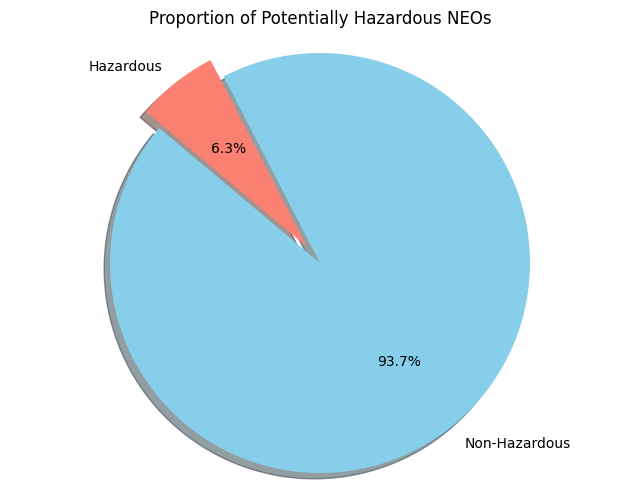

In [13]:
# Write your code or/and markdowns
import matplotlib.pyplot as plt

# Calculate proportions
hazardous_count = neo_df['is_potentially_hazardous_asteroid'].sum()
non_hazardous_count = len(neo_df) - hazardous_count

# Data for the pie chart
labels = ['Non-Hazardous', 'Hazardous']
sizes = [non_hazardous_count, hazardous_count]
colors = ['skyblue', 'salmon']
explode = (0, 0.1)  # explode the 2nd slice (Hazardous)

# Plotting the pie chart
plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Proportion of Potentially Hazardous NEOs')
plt.axis('equal')  # Equal aspect ratio ensures the pie is drawn as a circle.

# Save the plot as a PNG file
plt.savefig('proportion_hazardous_neos.png')

### Task 3: Data Visualization Part A

- Create a line plot of the number of NEOs per week.
- Create a histogram of the distribution of NEO sizes.
- Create a bar plot of the average NEO size per week.
- Use a library like Seaborn to create more complex visualizations, such as a box plot of the NEO sizes or a heat map of the number of NEOs per week. **Be creative**!

In [ ]:
# Write your code and markdowns

**Textbook Practice**: You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)

In [ ]:
# Write your code or/and markdowns

### Task 4: Data Visualization Part B

- Create a pie chart of the proportion of hazardous vs non-hazardous NEOs.
- Create a scatter plot of the correlation between NEO size and close approach distance.
- Customize the appearance of your plots (e.g., colors, labels, titles).
- Create interactive visualizations using a library like Plotly. For example, create an interactive scatter plot where you can hover over each point to see more information about the NEO. **Be creative!**

In [ ]:
# Write your code and markdowns

**Textbook Practice**: You need to explain how the principle "Draw attention there you want it" (Chapter 4) is applied for making all the visualizations.

In [ ]:
# Write your code or/and markdowns

### Task 5: Interpretation of Results

- Interpret the results of your data visualization in part A and B. 
- What insights can you gain about NEOs from your results? Summarizing your main findings with a single visualization plot. **Textbook Practice**: You need to explain how the principles below are used for making this plot:
  - "Choose an appropriate display" (Chapter 2)
  - "Eliminate clutter" (Chapter 3)
  - "Draw attention there you want it" (Chapter 4)
  - "Think like a designer" (Chapter 5)

- Use your findings to make predictions or recommendations. For example, if you found that larger NEOs are more likely to be potentially hazardous, you could recommend that more resources be allocated to tracking large NEOs. **Be creative!**
- Identify, understand, and explain one scientific paper, on a clustering or classification method of relevance that could help Task 5. You don't have to implement it, you just need to justify in this notebook why the method in the scientific paper could contribute in analysis or interpretation of the results.

In [ ]:
# Write your code and markdowns

### Task 6: Presentation and Documentation

- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This should include an overview of your work, the results of your data analysis, and the insights you gained from your results. The **Textbook Practice** parts (that consists of your reflections to the textbook content) are crucial.